# Цифровая обработка изображений. Лабораторная работа №1

## Работа с изображениями

**Выполнил студент:** Уваров Глеб Алексеевич  
**Группа:** 6132-090401D 



## Подготовка к выполнению

Импорты необходимых библиотек, создание папок data и output. В папке data находятся тестовые изображения, а в output будут сохраняться результаты работы программы.

In [31]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Video, display, Image as IPImage, HTML

DATA_DIR = "data"
OUTPUT_DIR = "output"
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(OUTPUT_DIR, exist_ok=True)

COLOR_IMAGE_PATH = os.path.join(DATA_DIR, "color_image.jpg")
GRAY_IMAGE_PATH = os.path.join(DATA_DIR, "gray_image.png")

print("Папка с исходными изображениями:", DATA_DIR)
print("Папка для результатов:", OUTPUT_DIR)
print("Исходные файлы:", os.listdir(DATA_DIR))

Папка с исходными изображениями: data
Папка для результатов: output
Исходные файлы: ['color_image.jpg', 'gray_image.png']


# 1. Регистрация изображений и видео с веб-камеры/камеры устройства

## 1.1 Захват изображения с веб-камеры и сохранение на диск

Программа пытается открыть камеру с индексом 0, считывает один кадр и сохраняет его в папку output. Если камера недоступна, кадр не сохраняется, а в блокноте выводится сообщение о том, что изображение с веб-камеры не было получено.

При отображении результата учитывается, что OpenCV работает с изображениями в формате BGR, а matplotlib ожидает формат RGB. Поэтому перед выводом изображения выполняется преобразование цветовых каналов.

Кадр с веб-камеры сохранен: output\webcam_image.jpg


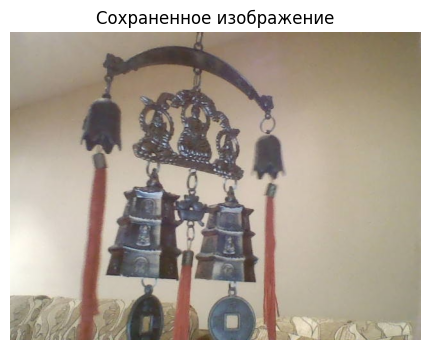

In [32]:
image_output_path = os.path.join(OUTPUT_DIR, "webcam_image.jpg")

cap = cv2.VideoCapture(0)

if cap.isOpened():

    ret, frame = cap.read()
    cap.release()

    if ret:
        cv2.imwrite(image_output_path, frame)
        print("Кадр с веб-камеры сохранен:", image_output_path)

        img_bgr = cv2.imread(image_output_path)

        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(6, 4))
        plt.imshow(img_rgb)
        plt.title("Сохраненное изображение")
        plt.axis("off")
        plt.show()
    else:
        print("Камера открылась, но кадр не был получен!")
else:
    cap.release()
    print("Камера недоступна. Изображение с веб-камеры не было сохранено!")

**Комментарии по заданию**

Для отображения изображения средствами matplotlib необходимо выполнить преобразование из BGR в RGB, иначе цвета на изображении могут отображаться некорректно.

## 1.2 Трансляция видео с веб-камеры и сохранение на диск

Программа записывает видео с веб-камеры в течение 5 секунд. В работе используется значение fps = 60, для плавности картинки.

In [33]:
video_output_path = os.path.join(OUTPUT_DIR, "webcam_video.mp4")

fps = 60
record_seconds = 5

cap = cv2.VideoCapture(0)

if cap.isOpened():

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)) or 640
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) or 480

    fourcc = cv2.VideoWriter_fourcc(*"H264")

    writer = cv2.VideoWriter(video_output_path, fourcc, fps, (width, height))

    frame_count = fps * record_seconds

    for _ in range(frame_count):
        ret, frame = cap.read()

        if not ret:
            print("Не удалось получить очередной кадр с камеры.")
            break

        writer.write(frame)

    cap.release()
    writer.release()

    print("Видео с веб-камеры сохранено:", video_output_path)

    display(Video(video_output_path, embed=True))

else:
    cap.release()
    print("Камера недоступна. Видео с веб-камеры не было сохранено.")

Видео с веб-камеры сохранено: output\webcam_video.mp4


**Комментарии**

Также используется OpenCV для получения видеопотока с веб-камеры. Команда cv2.VideoCapture(0) обращается к основной камере устройства. Если камера недоступна, занята другой программой или доступ к ней запрещен системой, видео не записывается, а в блокноте выводится сообщение об ошибке.
Для сохранения видео используется объект cv2.VideoWriter. Количество записываемых кадров вычисляется как произведение FPS на длительность записи в секундах.
После завершения записи камера и объект записи освобождаются с помощью release(). Это нужно для того, чтобы камера не осталась занятой после выполнения.

## 2.1 Перевод изображения в GrayScale, HSV, LAB и YCrCb. Сравнение яркостных каналов

Загружается полноцветное изображение. С помощью библиотеки OpenCV оно переводится в цветовые пространства GrayScale, HSV, LAB и YCrCb. Для сравнения используются каналы, связанные с яркостью или светлотой: Gray, V из HSV, L из LAB и Y из YCrCb.

Так как сравниваются четыре яркостных канала, попарно строятся шесть изображений разности. Разность считается по модулю. Чем светлее пиксель на изображении разности, тем сильнее отличаются значения соответствующих каналов в этой области.

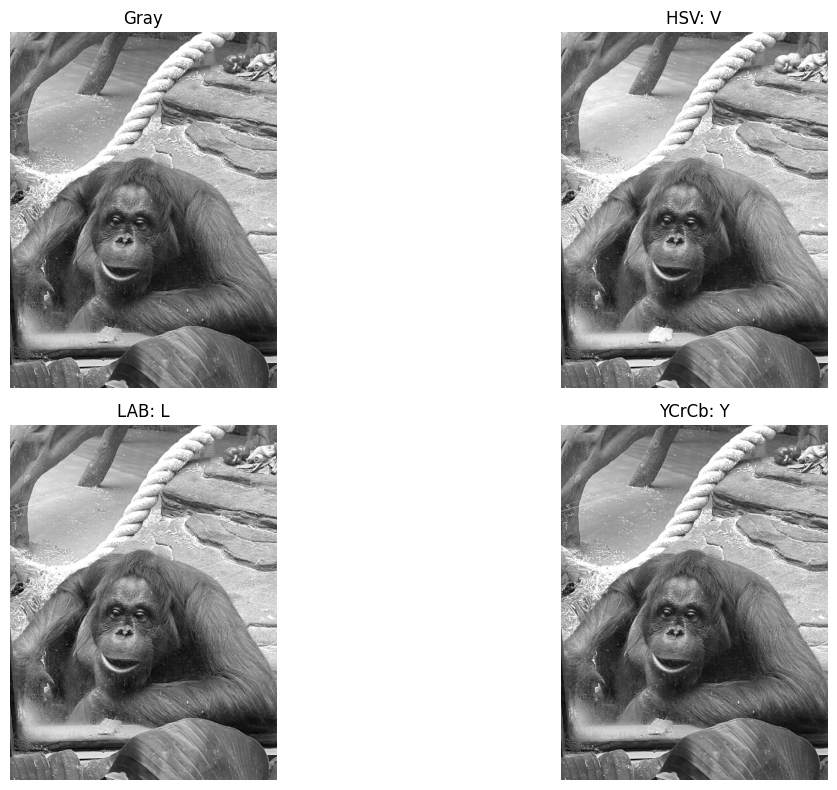

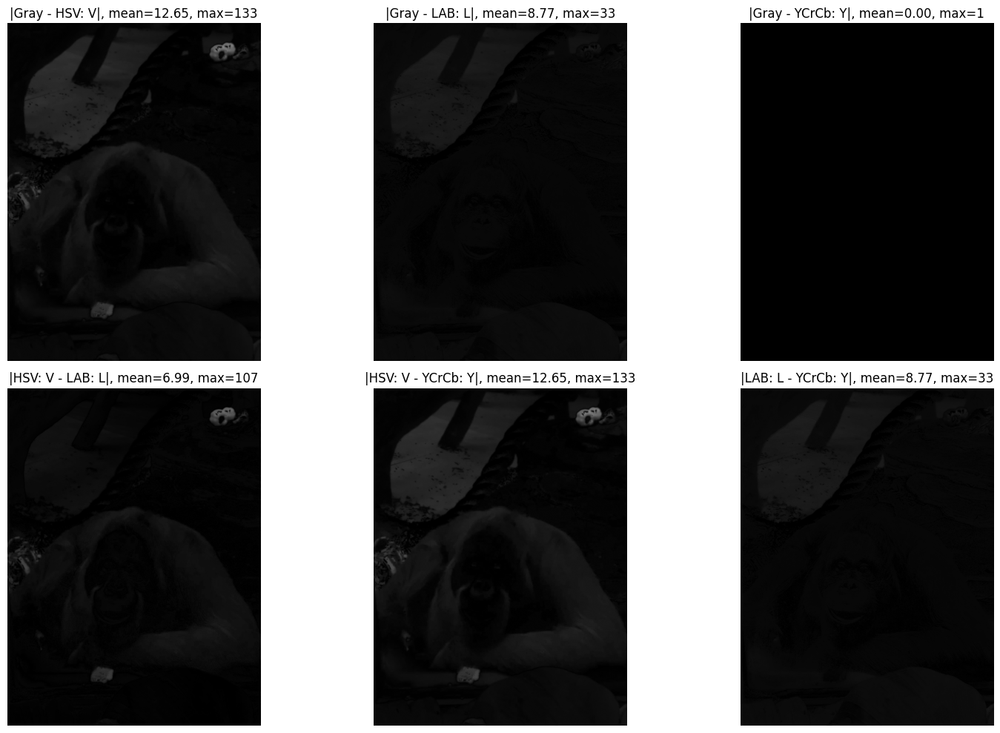

In [34]:
img_bgr = cv2.imread(COLOR_IMAGE_PATH)

# OpenCV загружает изображение в формате BGR, поэтому для отображения через matplotlib переводим его в RGB
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# Перевод исходного изображения в разные цветовые пространства
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
ycrcb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2YCrCb)

# Выделение каналов, связанных с яркостью или светлотой
V = hsv[:, :, 2]
L = lab[:, :, 0]
Y = ycrcb[:, :, 0]

channels = {
    "Gray": gray,
    "HSV: V": V,
    "LAB: L": L,
    "YCrCb: Y": Y
}

# Отображение яркостных каналов
plt.figure(figsize=(14, 8))

for i, (name, channel) in enumerate(channels.items(), 1):
    plt.subplot(2, 2, i)
    plt.imshow(channel, cmap="gray", vmin=0, vmax=255)
    plt.title(name)
    plt.axis("off")

plt.tight_layout()
plt.show()

# Все попарные сравнения четырех каналов
pairs = [
    ("Gray", "HSV: V"),
    ("Gray", "LAB: L"),
    ("Gray", "YCrCb: Y"),
    ("HSV: V", "LAB: L"),
    ("HSV: V", "YCrCb: Y"),
    ("LAB: L", "YCrCb: Y")
]

plt.figure(figsize=(16, 10))

for i, (a, b) in enumerate(pairs, 1):
    # Модуль разности 
    diff = cv2.absdiff(channels[a], channels[b])

    plt.subplot(2, 3, i)
    plt.imshow(diff, cmap="gray", vmin=0, vmax=255)
    plt.title(f"|{a} - {b}|, mean={diff.mean():.2f}, max={diff.max()}")
    plt.axis("off")

plt.tight_layout()
plt.show()

**Вывод**

По результатам видно, что Gray и Y из YCrCb почти совпадают. Это связано с тем, что оба канала описывают яркость изображения через взвешенную сумму цветовых каналов.

Сильнее всего отличается канал V из HSV. Он показывает не среднюю яркость пикселя, а максимальное значение среди цветовых каналов. Поэтому разность получается больше.

Таким образом, самые похожие результаты дали Gray и YCrCb:Y, близкий результат дал LAB:L, а HSV:V отличается заметнее из-за другого способа вычисления яркости.

## 2.2 Самостоятельное гамма-преобразование sRGB в линейное RGB и сравнение с библиотечным результатом

В этом пункте выполняется преобразование изображения из sRGB в линейное RGB. Для этого используется кусочная функция гамма-преобразования. Затем результат сравнивается с библиотечным способом: сначала изображение переводится из sRGB в XYZ, после чего через обратную матрицу получается линейное RGB.

Сравнение выполняется через модуль разности. Чем меньше средняя и максимальная разность, тем ближе результат ручной реализации к библиотечному расчету.

Средняя разность: 7.114536e-06
Максимальная разность: 8.1181526e-05


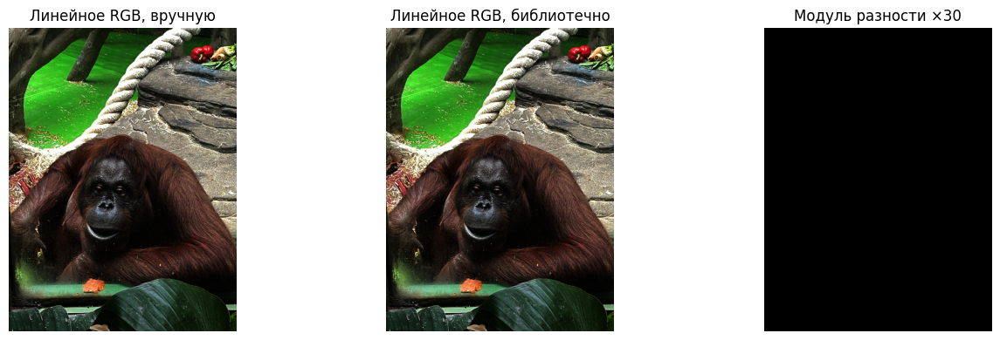

In [35]:
from skimage.color import rgb2xyz

# Нормируем значения пикселей из диапазона 0–255 в диапазон 0–1
rgb = img_rgb.astype(np.float32) / 255.0

# Ручная реализация перехода из sRGB в линейное RGB
def srgb_to_linear_manual(srgb):
    return np.where(
        srgb <= 0.04045,
        srgb / 12.92,
        ((srgb + 0.055) / 1.055) ** 2.4
    )

linear_manual = srgb_to_linear_manual(rgb)

# Библиотечная реализация
xyz_lib = rgb2xyz(rgb)

# Матрица обратного преобразования из XYZ в линейное RGB
M_XYZ_to_RGB = np.array([
    [ 3.2404542, -1.5371385, -0.4985314],
    [-0.9692660,  1.8760108,  0.0415560],
    [ 0.0556434, -0.2040259,  1.0572252]
], dtype=np.float32)

# Умножение на обратную матрицу возвращает изображение к линейному RGB
linear_lib = np.clip(xyz_lib @ M_XYZ_to_RGB.T, 0, 1)

# Считаем модуль разности между ручным и библиотечным результатом
diff = np.abs(linear_manual - linear_lib)

print("Средняя разность:", diff.mean())
print("Максимальная разность:", diff.max())

plt.figure(figsize=(14, 4))

plt.subplot(1, 3, 1)
plt.imshow(linear_manual)
plt.title("Линейное RGB, вручную")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(linear_lib)
plt.title("Линейное RGB, библиотечно")
plt.axis("off")

# Разность умножается на 30, чтобы очень малые отличия стали видимыми
plt.subplot(1, 3, 3)
plt.imshow(np.clip(diff * 30, 0, 1))
plt.title("Модуль разности ×30")
plt.axis("off")

plt.tight_layout()
plt.show()

**Комментарий по результатам**

По результатам видно, что ручное и библиотечное преобразования дают практически одинаковые изображения. Средняя разность получилась очень маленькой, а изображение модуля разности почти полностью черное даже после усиления в 30 раз.

Небольшие отличия могут появляться из-за округления чисел, использования разных типов данных и особенностей библиотечного преобразования. Визуально эти отличия почти не заметны.

Таким образом, ручная реализация гамма-преобразования из sRGB в линейное RGB работает корректно и дает результат, близкий к библиотечному.

## 2.3 Самостоятельное преобразование sRGB → XYZ → sRGB и сравнение с исходным изображением

Сначала изображение переводится из sRGB в линейное RGB. Затем применяется матрица перехода RGB → XYZ. После обратного перехода XYZ → RGB выполняется обратное гамма-преобразование, и результат сравнивается с исходным изображением.

Средняя разность: 0.0
Максимальная разность: 0


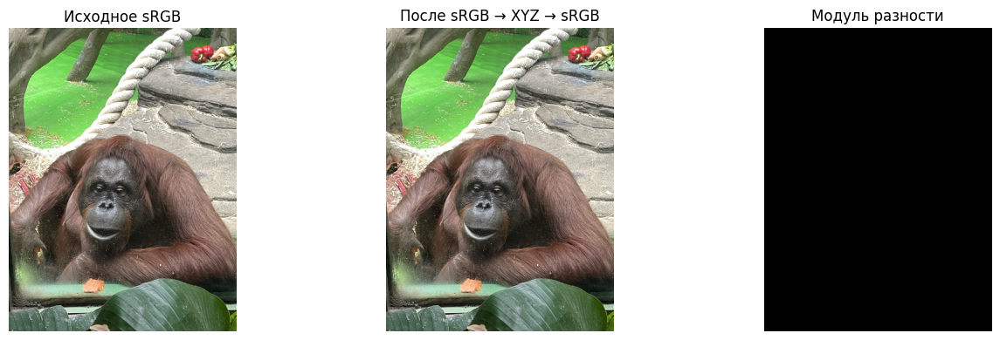

In [36]:
# из линейного RGB обратно в sRGB
def linear_to_srgb_manual(linear):
    return np.where(
        linear <= 0.0031308,
        12.92 * linear,
        1.055 * (linear ** (1 / 2.4)) - 0.055
    )

# Матрица преобразования из линейного RGB в XYZ
M_RGB_to_XYZ = np.array([
    [0.4124564, 0.3575761, 0.1804375],
    [0.2126729, 0.7151522, 0.0721750],
    [0.0193339, 0.1191920, 0.9503041]
], dtype=np.float32)

# Перевод sRGB в линейное RGB перед матричным преобразованием
linear_rgb = srgb_to_linear_manual(rgb)

# Преобразование линейного RGB в XYZ через матрицу
xyz_manual = linear_rgb @ M_RGB_to_XYZ.T

# Обратное преобразование XYZ в линейное RGB
linear_rgb_restored = np.clip(xyz_manual @ M_XYZ_to_RGB.T, 0, 1)

# Возврат из линейного RGB в обычное sRGB
srgb_restored = np.clip(linear_to_srgb_manual(linear_rgb_restored), 0, 1)

# Перевод результата обратно в диапазон 0–255 для сравнения с исходным изображением
restored_uint8 = np.round(srgb_restored * 255).astype(np.uint8)
original_uint8 = img_rgb

# Модуль разности 
diff_uint8 = cv2.absdiff(original_uint8, restored_uint8)

print("Средняя разность:", diff_uint8.mean())
print("Максимальная разность:", diff_uint8.max())

plt.figure(figsize=(14, 4))

plt.subplot(1, 3, 1)
plt.imshow(original_uint8)
plt.title("Исходное sRGB")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(restored_uint8)
plt.title("После sRGB → XYZ → sRGB")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(diff_uint8)
plt.title("Модуль разности")
plt.axis("off")

plt.tight_layout()
plt.show()

**Комментарий по результатам**

По результатам видно, что после преобразования sRGB → XYZ → sRGB изображение полностью совпало с исходным. Средняя разность равна 0, максимальная разность тоже равна 0. Это значит, что при выбранных формулах, матрицах и округлении пиксели восстановились без видимых и численных отличий.

Можно сделать вывод, что ручная процедура преобразования sRGB в XYZ и обратно реализована корректно.

## 2.4 Выделение зеленых цветов в HSV и обработка насыщенности

В пространстве HSV задается диапазон оттенков, соответствующий зеленому цвету. По нему строится бинарная маска. Затем для всех пикселей, кроме зеленых, насыщенность обнуляется, поэтому незеленые области становятся серыми.

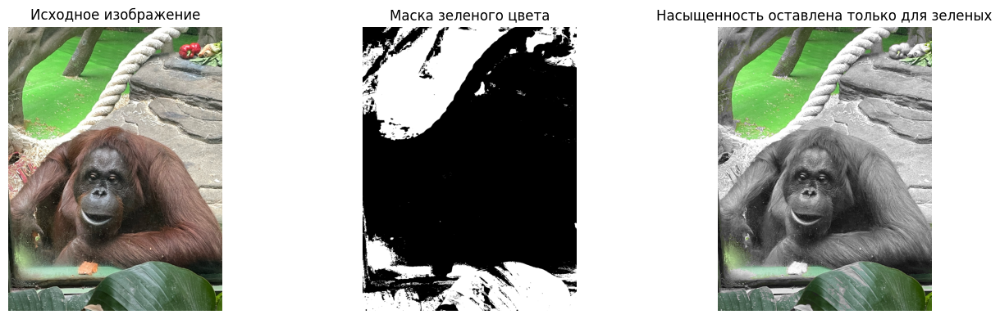

In [37]:
# Перевод изображения из BGR в HSV
hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

# Диапазон зеленого цвета в HSV.
lower_green = np.array([35, 40, 40])
upper_green = np.array([85, 255, 255])

# Создание бинарной маски. Белым отмечаются пиксели, попавшие в диапазон зеленого
mask_green = cv2.inRange(hsv, lower_green, upper_green)

hsv_processed = hsv.copy()

# Для всех пикселей вне маски насыщенность S обнуляется.
# За счет этого не зеленые области становятся серыми.
hsv_processed[:, :, 1] = np.where(mask_green > 0, hsv_processed[:, :, 1], 0)

# Возвращаем изображение обратно в RGB для отображения через matplotlib
processed_bgr = cv2.cvtColor(hsv_processed, cv2.COLOR_HSV2BGR)
processed_rgb = cv2.cvtColor(processed_bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 4))

plt.subplot(1, 3, 1)
plt.imshow(img_rgb)
plt.title("Исходное изображение")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask_green, cmap="gray")
plt.title("Маска зеленого цвета")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(processed_rgb)
plt.title("Насыщенность оставлена только для зеленых")
plt.axis("off")

plt.tight_layout()
plt.show()

**Комментарий по результатам**

По результатам видно, что маска действительно выделила в основном зеленые области изображения. Эти участки на маске отображаются белым цветом, а остальные области (которые незеленые) - черные.

После обработки цвет остался только у пикселей, которые попали в диапазон зеленого цвета. У остальных пикселей насыщенность была обнулена, поэтому они стали серыми. 

Диапазон зеленого цвета можно регулировать с помощью нижней и верхней границ lower_green и upper_green. В первую очередь меняется значение H, которое отвечает за оттенок цвета. Если расширить диапазон H, в маску попадет больше зеленоватых оттенков. Если сузить диапазон, выделение станет строже. Значения S и V тоже можно изменять, ведь S отвечает за насыщенность, а V за яркость. Поэтому с их помощью можно исключать слишком бледные или слишком темные участки.

# 3. Контрастирование. Гистограмма изображения и выравнивание гистограммы

## 3.1 Изменение контрастности изображения библиотечной функцией и точечный график зависимости яркости

Загружается изображение в градациях серого. Для изменения контрастности используется библиотечная функция cv2.convertScaleAbs. Параметр alpha отвечает за усиление различий между яркостями пикселей, а параметр beta задает общий сдвиг яркости.

После обработки строится точечный график зависимости результирующей яркости от исходной. 

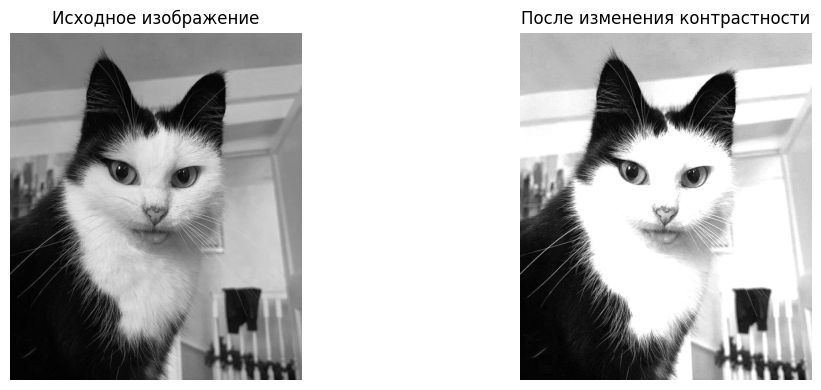

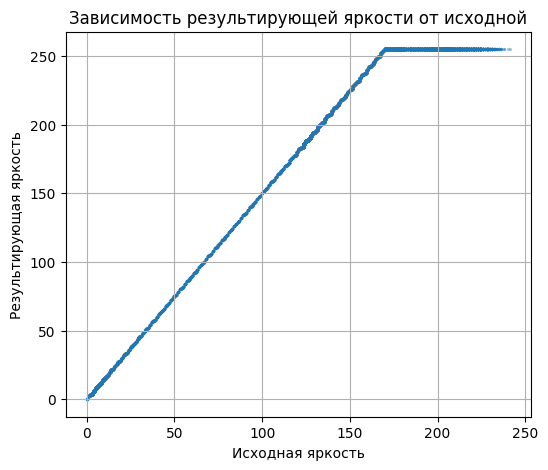

In [38]:
gray_img = cv2.imread(GRAY_IMAGE_PATH, cv2.IMREAD_GRAYSCALE)

# alpha больше 1 усиливает контрастность изображения
alpha = 1.5

# beta равен 0, поэтому общий сдвиг яркости не применяется
beta = 0

# Библиотечное изменение яркости по формуле: result = alpha * pixel + beta
contrast_lib = cv2.convertScaleAbs(gray_img, alpha=alpha, beta=beta)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(gray_img, cmap="gray", vmin=0, vmax=255)
plt.title("Исходное изображение")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(contrast_lib, cmap="gray", vmin=0, vmax=255)
plt.title("После изменения контрастности")
plt.axis("off")

plt.tight_layout()
plt.show()

# Для графика берется не каждый пиксель, а каждый 20-й, чтобы точек было меньше и график не был перегружен
orig_values = gray_img.flatten()[::20]
res_values = contrast_lib.flatten()[::20]

plt.figure(figsize=(6, 5))
plt.scatter(orig_values, res_values, s=2, alpha=0.3)
plt.xlabel("Исходная яркость")
plt.ylabel("Результирующая яркость")
plt.title("Зависимость результирующей яркости от исходной")
plt.grid(True)
plt.show()

**Комментарий по результатам**

После увеличения контрастности изображение стало более выразительным: темные участки стали темнее, а светлые - светлее. За счет этого границы и детали стали заметнее.

На точечном графике видно, что зависимость результирующей яркости от исходной почти линейная. Это связано с тем, что функция cv2.convertScaleAbs умножает значения пикселей на коэффициент alpha. При alpha = 1.5 различия между яркостями усиливаются.

В правой верхней части графика линия выходит на уровень 255. Это происходит потому, что значения яркости не могут быть больше 255. Если после умножения значение становится выше 255, оно ограничивается максимальной яркостью. 

## 3.2 Кусочно-линейная функция контрастирования

Задается кусочно-линейная функция изменения яркости. Она строится по нескольким контрольным точкам. Каждому исходному значению яркости от 0 до 255 ставится в соответствие новое значение яркости.

Для применения преобразования используется таблица соответствия LUT. Такой способ удобен тем, что сначала заранее рассчитываются новые значения для всех уровней яркости, а затем они быстро применяются ко всему изображению.

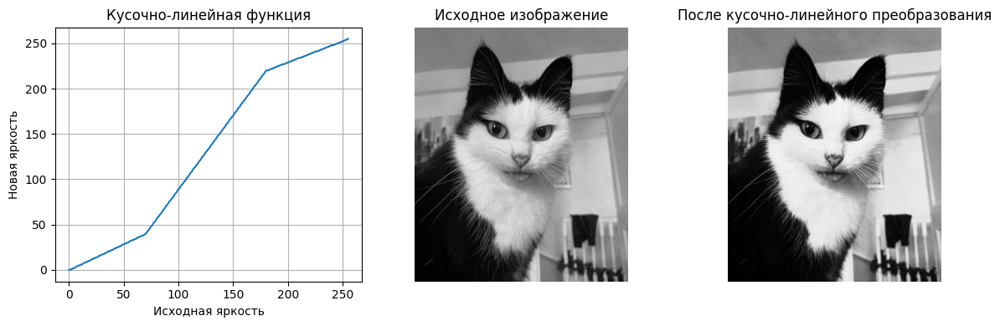

In [39]:
# исходная яркость и соответствующая ей новая яркость
points_x = np.array([0, 70, 180, 255])
points_y = np.array([0, 40, 220, 255])

# По контрольным точкам строится таблица преобразования для всех яркостей
lut = np.interp(np.arange(256), points_x, points_y).astype(np.uint8)

# Применение таблицы преобразования к изображению
contrast_piecewise = cv2.LUT(gray_img, lut)

plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(np.arange(256), lut)
plt.title("Кусочно-линейная функция")
plt.xlabel("Исходная яркость")
plt.ylabel("Новая яркость")
plt.grid(True)

plt.subplot(1, 3, 2)
plt.imshow(gray_img, cmap="gray", vmin=0, vmax=255)
plt.title("Исходное изображение")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(contrast_piecewise, cmap="gray", vmin=0, vmax=255)
plt.title("После кусочно-линейного преобразования")
plt.axis("off")

plt.tight_layout()
plt.show()

**Комментарий по результатам**

После кусочно-линейного преобразования изображение стало более контрастным. Темные участки стали темнее, а светлые участки стали светлее. Поэтому границы между черной и белой шерстью стали заметнее.

На графике функции видно, что разные диапазоны яркости изменяются по-разному. На участке от 70 до 180 наклон функции самый большой. Это значит, что яркости в этом диапазоне растягиваются сильнее всего, поэтому контраст деталей со средней яркостью увеличивается.

На участках с меньшим наклоном изменения слабее. Например, темные значения от 0 до 70 сжимаются, поэтому часть темных деталей может стать менее различимой. Светлые значения от 180 до 255 тоже изменяются не так резко.

Таким образом, наклон кусочно-линейной функции напрямую связан с контрастностью: чем больше наклон на выбранном участке, тем сильнее увеличивается контраст деталей в этом диапазоне яркости.

## 3.3 Гистограммы исходного и результирующего изображения

Строятся гистограммы яркости исходного изображения и изображения после кусочно-линейного контрастирования. Гистограмма показывает, сколько пикселей имеет каждый уровень яркости.

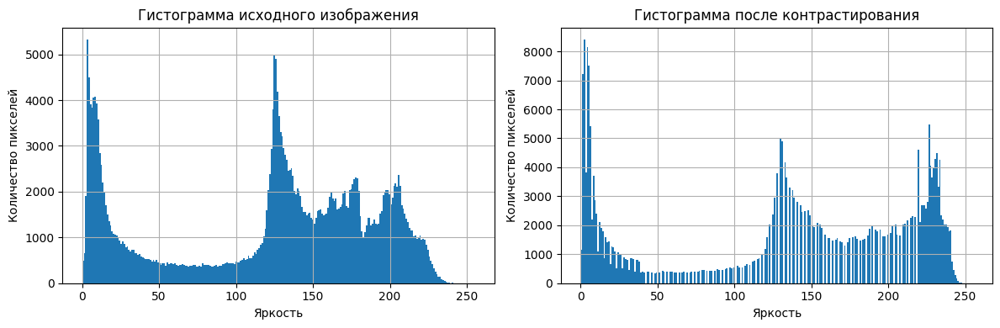

In [40]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)

# Гистограмма показывает распределение пикселей по уровням яркости
plt.hist(gray_img.flatten(), bins=256, range=(0, 255))
plt.title("Гистограмма исходного изображения")
plt.xlabel("Яркость")
plt.ylabel("Количество пикселей")
plt.grid(True)

plt.subplot(1, 2, 2)

# гистограмма после кусочно-линейного преобразования
plt.hist(contrast_piecewise.flatten(), bins=256, range=(0, 255))
plt.title("Гистограмма после контрастирования")
plt.xlabel("Яркость")
plt.ylabel("Количество пикселей")
plt.grid(True)

plt.tight_layout()
plt.show()

**Комментарий по результатам** 

На гистограмме исходного изображения видно, что пиксели распределены неравномерно. Есть выраженные группы темных, средних и светлых значений. После контрастирования распределение яркостей изменилось. Часть темных пикселей сместилась ближе к нулю, а часть светлых - ближе к большим значениям яркости. Разница между темными и светлыми областями увеличилась. Также видно, что после преобразования некоторые значения яркости стали встречаться чаще. Это связано с тем, что кусочно-линейная функция по-разному растягивает и сжимает отдельные диапазоны яркости. В результате форма гистограммы чуть изменилась.

## 3.4 Эквализация гистограммы изображения в градациях серого

В этом пункте выполняется эквализация гистограммы изображения в градациях серого. Для этого используется библиотечная функция cv2.equalizeHist.

Эквализация перераспределяет значения яркости так, чтобы лучше использовать весь диапазон от 0 до 255. .

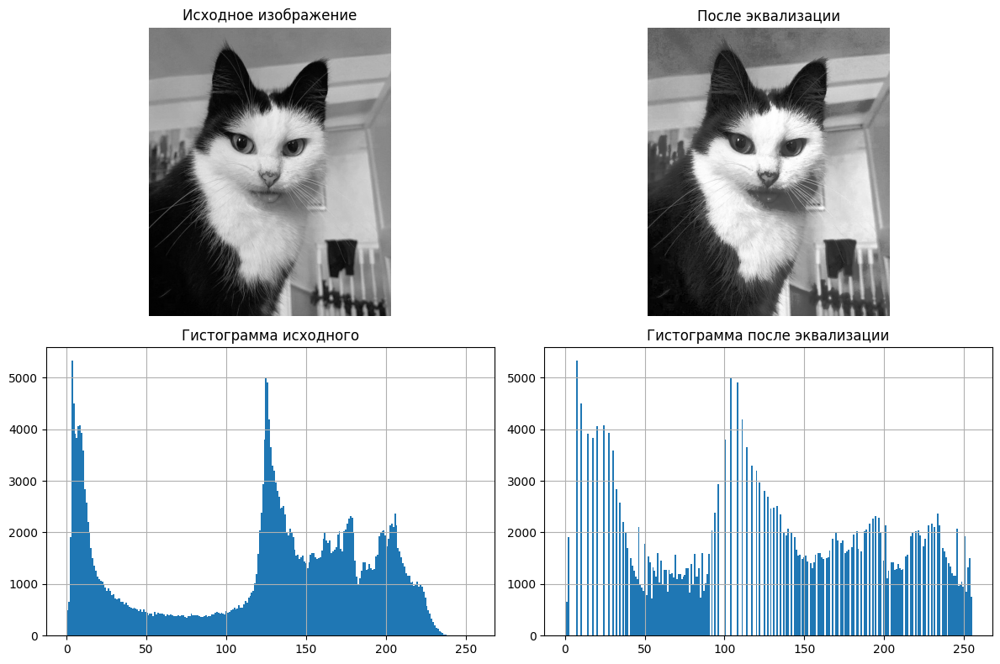

In [41]:
# Эквализация гистограммы изображения 
equalized_gray = cv2.equalizeHist(gray_img)

plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(gray_img, cmap="gray", vmin=0, vmax=255)
plt.title("Исходное изображение")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(equalized_gray, cmap="gray", vmin=0, vmax=255)
plt.title("После эквализации")
plt.axis("off")

plt.subplot(2, 2, 3)

# Гистограмма исходного изображения 
plt.hist(gray_img.flatten(), bins=256, range=(0, 255))
plt.title("Гистограмма исходного")
plt.grid(True)

plt.subplot(2, 2, 4)

# После эквализации яркости 
plt.hist(equalized_gray.flatten(), bins=256, range=(0, 255))
plt.title("Гистограмма после эквализации")
plt.grid(True)

plt.tight_layout()
plt.show()

**Комментарий по результатам** 

После эквализации изображение стало более контрастным. Темные участки стали немного темнее, а светлые - светлее. За счет этого отдельные детали на изображении стали заметнее. По гистограммам видно, что до обработки значения яркости были распределены неравномерно. После эквализации яркости перераспределились по более широкому диапазону. Гистограмма стала более растянутой по шкале от 0 до 255. Эквализация не делает гистограмму полностью ровной, потому что изображение имеет ограниченное количество пикселей и повторяющиеся значения яркости.

## 3.5 Эквализация яркостного канала полноцветного изображения

В этом пункте загружается полноцветное изображение. Оно переводится в цветовое пространство LAB, где канал L отвечает за светлоту, а каналы A и B хранят цветовую информацию.

Эквализация применяется только к каналу L. Это позволяет изменить яркость и контрастность изображения, не изменяя напрямую цветовые каналы. После обработки каналы снова объединяются, и изображение переводится обратно в RGB для отображения.

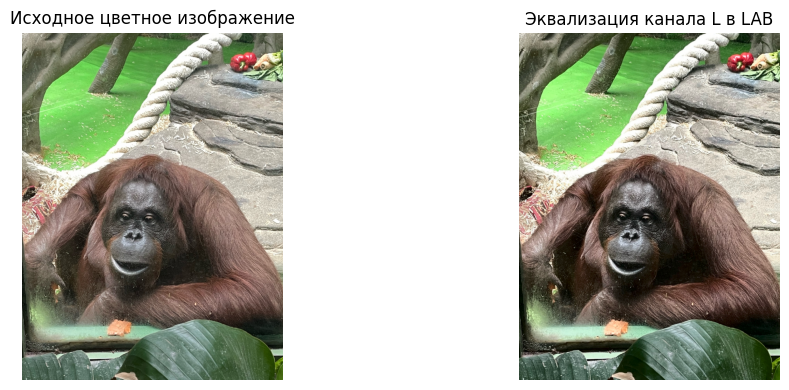

In [42]:
color_bgr = cv2.imread(COLOR_IMAGE_PATH)

# Переводим изображение в LAB, чтобы отдельно работать со светлотой
lab_color = cv2.cvtColor(color_bgr, cv2.COLOR_BGR2LAB)

# Разделяем изображение на канал светлоты L и цветовые каналы A, B
L, A, B = cv2.split(lab_color)

# Эквализация применяется только к каналу L
L_equalized = cv2.equalizeHist(L)

# Объединяем обработанный канал L с исходными цветовыми каналами
lab_equalized = cv2.merge([L_equalized, A, B])

# Возвращаем изображение обратно в BGR, а затем в RGB для matplotlib
color_equalized_bgr = cv2.cvtColor(lab_equalized, cv2.COLOR_LAB2BGR)
color_equalized_rgb = cv2.cvtColor(color_equalized_bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title("Исходное цветное изображение")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(color_equalized_rgb)
plt.title("Эквализация канала L в LAB")
plt.axis("off")

plt.tight_layout()
plt.show()

**Комментарий по результатам**

После эквализации канала L изображение стало более контрастным. При этом основные цвета изображения сохранились, потому что цветовые каналы A и B не изменялись.
Можно сделать вывод, что пространство LAB удобно использовать для улучшения контраста цветных изображений.

# Общие выводы

В ходе лабораторной работы были рассмотрены базовые операции цифровой обработки изображений. Реализованы захват изображения и запись видео с веб-камеры, а также сохранение результатов на диск. Изображение было переведено в разные цветовые пространства, после чего были сравнены яркостные каналы. Было показано, что яркость и светлота в разных моделях вычисляются по-разному, поэтому соответствующие каналы не совпадают полностью.

Также были реализованы гамма-преобразование sRGB в линейное RGB и матричный переход между sRGB и XYZ. После обратного преобразования изображение практически совпало с исходным, а небольшие отличия объясняются округлением и численной точностью. На основе HSV была построена маска зеленых цветов и выполнена обработка насыщенности.

В части контрастирования были применены библиотечное изменение контрастности, кусочно-линейное преобразование яркости и эквализация гистограммы. Было показано, что наклон функции яркостного преобразования влияет на контраст деталей: при увеличении наклона различия яркости усиливаются, а при уменьшении - сжимаются. Эквализация гистограммы позволяет более полно использовать диапазон яркости и повысить визуальную различимость деталей.